# import all

In [1]:
'/home/hmf/work/FA_test/nb/check_focalplane.py'
import sys
from fiberassign.hardware import load_hardware
from fiberassign.assign import read_assignment_fits_tile
from test_MUST_fp import *
import os
os.environ["DESIMODEL"] = os.path.expanduser("~/work/FA_test/desi")
print(os.environ["DESIMODEL"])
from fiberassign.hardware import radec2xy
import sys
from fiberassign.hardware import load_hardware
from fiberassign.assign import read_assignment_fits_tile



infile = '/home/hmf/work/FA_test/output/targets_exdense_box5_00_10000_10vist000005.fits'

header, fiber_data, targets_data, avail_data, gfa_data = \
        read_assignment_fits_tile(infile)
tile_id = int(header["TILEID"])
tile_ra = float(header["TILERA"])
tile_dec = float(header["TILEDEC"])
print(tile_id, tile_ra, tile_dec)
tile_theta = float(header["FIELDROT"])
tile_obstime = header["FA_PLAN"]
tile_obsha = float(header["FA_HA"])
tile_obsha = float(header["FA_HA"])
run_date = header["FA_RUN"]
margins = {}
for key in ['pos', 'gfa', 'module']:
    hdrkey = "FA_M_%s" % key[:3]
    if hdrkey in header:
        margins[key] = header[hdrkey]
# load hardware
hw = load_hardware(rundate=run_date, add_margins=margins)


/home/hmf/work/FA_test/desi
5 5.64 5.64
Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken


In [15]:
from astropy.table import Table

# Tiles = Table.read('/home/hmf/work/FA_test/MUST_mock/tiles_DECaLS_GRAY_0.fits')

# Tiles = Table.read('/home/hmf/work/FA_test/MUST_mock/tiles_DECaLS_GRAY_2.fits')
# Target = Table.read('/home/hmf/work/FA_test/MUST_mock/MUST_BGS_0-360.fits')
Tiles = Table.read('/home/hmf/work/FA_test/MUST_mock/tiles_CSST_DARK_1.fits')
Target = Table.read('/home/hmf/work/FA_test/MUST_mock/MUST_LBG_0-360.fits')


# print(Tiles)
print(Target.colnames)
print(Tiles.colnames)

Original Tiles OBSCONDITIONS: 0
Test Tiles OBSCONDITIONS: 0


In [10]:
print(Target['OBSCONDITIONS'].min(), Target['OBSCONDITIONS'].max())
print(Tiles['OBSCONDITIONS'])


OBSCONDITIONS
-------------
            0
            0
            0
            0
            0
            0
            0
            0
            0
            0
          ...
            0
            0
            0
            0
            0
            0
            0
            0
            0
            0
Length = 12176686 rows
OBSCONDITIONS
-------------
            0


In [ ]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.table import Table, vstack
from matplotlib.collections import PatchCollection
from matplotlib.patches import Circle, Ellipse


def wrap_ra(ra, center=180):
    ra = np.asarray(ra, dtype=float)
    return (ra + center) % 360 - center


def select_targets_near_tile(target, ra_center, dec_center, ra_half_width=2.3, dec_half_width=1.3):
    mask = (
        (target['RA'] > ra_center - ra_half_width)
        & (target['RA'] < ra_center + ra_half_width)
        & (target['DEC'] > dec_center - dec_half_width)
        & (target['DEC'] < dec_center + dec_half_width)
    )
    return target[mask]


def read_tile_center_from_fits(fits_file, ext_preferences=(1, 0)):
    for ext in ext_preferences:
        try:
            header = fits.getheader(fits_file, ext=ext)
        except Exception:
            continue
        if header.get('TILERA') is not None and header.get('TILEDEC') is not None:
            return header['TILERA'], header['TILEDEC']
    raise KeyError(f'Cannot find TILERA/TILEDEC in {fits_file}')


def collect_unique_assignments(files, keep_assigned_only=True, columns=('TARGETID', 'TARGET_RA', 'TARGET_DEC')):
    files = sorted(files)
    fa_list = []
    for file in files:
        tab = Table.read(file)
        if keep_assigned_only and 'FA_TYPE' in tab.colnames:
            tab = tab[tab['FA_TYPE'] > 0]
        fa_list.append(tab[list(columns)])

    if not fa_list:
        raise ValueError('No fiberassign files found.')

    fa_all = vstack(fa_list)
    unique_ids, unique_idx = np.unique(fa_all['TARGETID'], return_index=True)
    fa_unique = fa_all[np.sort(unique_idx)]

    stats = {
        'n_rows': len(fa_all),
        'n_unique': len(unique_ids),
        'unique_fraction': len(unique_ids) / len(fa_all) if len(fa_all) else 0.0,
    }
    return fa_all, fa_unique, stats


def compute_completeness_grid(target_xy, assigned_xy, x_bins, y_bins):
    target_x, target_y = target_xy
    assigned_x, assigned_y = assigned_xy

    H_target, _, _ = np.histogram2d(target_x, target_y, bins=[x_bins, y_bins])
    H_assigned, _, _ = np.histogram2d(assigned_x, assigned_y, bins=[x_bins, y_bins])

    completeness = np.zeros_like(H_target, dtype=float)
    mask = H_target > 0
    completeness[mask] = H_assigned[mask] / H_target[mask]

    return {
        'H_target': H_target,
        'H_assigned': H_assigned,
        'completeness': completeness,
        'x_bins': np.asarray(x_bins),
        'y_bins': np.asarray(y_bins),
    }


def plot_targets_vs_tiles(target, tiles, sample_step=1000, figsize=(8, 6), title='Targets vs Tiles', ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure

    sub = target[::sample_step]
    ax.scatter(sub['RA'], sub['DEC'], s=1, alpha=0.5, label='targets')
    ax.scatter(tiles['RA'], tiles['DEC'], c='r', marker='*', s=20, label='tiles')
    ax.set_xlabel('RA [deg]')
    ax.set_ylabel('Dec [deg]')
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    ax.legend()
    return fig, ax


def plot_fba_tile_view(
    fba_res,
    tile_ra,
    tile_dec,
    background_target=None,
    wrap_center=180,
    background_window=None,
    ellipse_diameter=2.56,
    figsize=(12, 10),
    xlim=None,
    ylim=None,
    invert_xaxis=False,
    title=None,
    ax=None,
):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure

    mask = fba_res['FA_TYPE'] == 1
    target_ra = wrap_ra(fba_res['TARGET_RA'], center=wrap_center)
    target_dec = np.asarray(fba_res['TARGET_DEC'], dtype=float)
    tile_ra = np.atleast_1d(np.asarray(tile_ra, dtype=float))
    tile_dec = np.atleast_1d(np.asarray(tile_dec, dtype=float))
    tile_ra_wrapped = wrap_ra(tile_ra, center=wrap_center)
    delta_ra = ellipse_diameter / np.cos(np.radians(tile_dec))

    ax.scatter(target_ra[~mask], target_dec[~mask], s=2, alpha=0.5, c='tomato', label='non-targets')
    ax.scatter(target_ra[mask], target_dec[mask], s=2, alpha=0.5, label='targets')

    if background_target is not None:
        if background_window is None:
            window_target = background_target
        else:
            window_target = select_targets_near_tile(
                background_target,
                tile_ra[0],
                tile_dec[0],
                ra_half_width=background_window[0],
                dec_half_width=background_window[1],
            )
        ax.scatter(window_target['RA'], window_target['DEC'], s=2, alpha=0.35, c='green', label='targets_all')

    ellipses = [
        Ellipse((ra, dec), dra, ellipse_diameter)
        for ra, dec, dra in zip(tile_ra_wrapped, tile_dec, delta_ra)
    ]
    collection = PatchCollection(
        ellipses,
        facecolor='none',
        edgecolor='red',
        lw=2,
        alpha=0.8,
        zorder=2,
    )
    ax.add_collection(collection)
    ax.scatter(tile_ra_wrapped, tile_dec, color='red', s=50, zorder=3, label='tile center')

    ax.set_xlabel('RA')
    ax.set_ylabel('DEC')
    if title is not None:
        ax.set_title(title)
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)
    if invert_xaxis:
        ax.invert_xaxis()
    ax.legend()
    return fig, ax


def plot_multiple_fba_tiles(files, wrap_center=180, ellipse_diameter=2.56, figsize=(24, 20), ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure

    for file in sorted(files):
        fba_res = Table.read(file)
        tile_ra, tile_dec = read_tile_center_from_fits(file)
        plot_fba_tile_view(
            fba_res,
            tile_ra,
            tile_dec,
            wrap_center=wrap_center,
            ellipse_diameter=ellipse_diameter,
            ax=ax,
        )

    return fig, ax


def plot_completeness_map(
    grid,
    tile_centers=None,
    tile_radius=1.28,
    figsize=(20, 10),
    dpi=150,
    min_target_count=10,
    scatter_points=None,
    scatter_label='assigned targets',
    circle_kwargs=None,
    title='Completeness Map with Tile Footprints',
    xlabel='RA [deg]',
    ylabel='DEC [deg]',
    xlim=None,
    ylim=None,
    ax=None,
):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    else:
        fig = ax.figure

    mesh = ax.pcolormesh(grid['x_bins'], grid['y_bins'], grid['completeness'].T, shading='auto')
    plt.colorbar(mesh, ax=ax, label='Completeness')

    if scatter_points is not None:
        scatter_x, scatter_y = scatter_points
        ax.scatter(scatter_x, scatter_y, s=1, alpha=0.5, label=scatter_label)

    for i in range(len(grid['x_bins']) - 1):
        for j in range(len(grid['y_bins']) - 1):
            if grid['H_target'][i, j] < min_target_count:
                continue
            x_center = 0.5 * (grid['x_bins'][i] + grid['x_bins'][i + 1])
            y_center = 0.5 * (grid['y_bins'][j] + grid['y_bins'][j + 1])
            value = grid['completeness'][i, j]
            color = 'white' if value < 0.5 else 'black'
            ax.text(x_center, y_center, f'{value:.2f}', ha='center', va='center', fontsize=7, color=color)

    if tile_centers is not None:
        circle_kwargs = circle_kwargs or {}
        base_circle_kwargs = {
            'edgecolor': 'red',
            'facecolor': 'none',
            'linewidth': 0.5,
            'alpha': 0.5,
        }
        base_circle_kwargs.update(circle_kwargs)
        for x_center, y_center in tile_centers:
            ax.add_patch(Circle((x_center, y_center), tile_radius, **base_circle_kwargs))

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    if xlim is not None:
        ax.set_xlim(*xlim)
    else:
        ax.set_xlim(grid['x_bins'][0], grid['x_bins'][-1])
    if ylim is not None:
        ax.set_ylim(*ylim)
    else:
        ax.set_ylim(grid['y_bins'][0], grid['y_bins'][-1])
    if scatter_points is not None or tile_centers is not None:
        ax.legend()
    plt.tight_layout()
    return fig, ax


def plot_completeness_curve(x_values, completeness_list, labels=('covered', 'all'), xlabel='N_pass', ylabel='completeness', ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = ax.figure

    for idx, label in enumerate(labels):
        ax.plot(x_values, [values[idx] for values in completeness_list], marker='o', label=label)

    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    return fig, ax



In [ ]:
plot_targets_vs_tiles(Target, Tiles, sample_step=1000)


In [6]:
i = 2
Tiles = Table.read('/home/hmf/work/FA_test/MUST_mock/tiles_DECaLS_GRAY_2_test.fits')
fba_res1 = Table.read(f'/home/hmf/work/FA_test/output/DECaLS_GRAY_2_LRG_test00000{i}.fits')

print(fba_res1.keys())
print(np.unique(fba_res1['FA_TYPE'], return_counts=True))
print(np.sum(fba_res1['FA_TYPE'] == 1), np.sum(fba_res1['FA_TYPE'] != 1))

plot_fba_tile_view(
    fba_res1,
    tile_ra=Tiles['RA'][i - 1],
    tile_dec=Tiles['DEC'][i - 1],
    background_target=TargetLRG,
    background_window=(2.3, 1.3),
    wrap_center=0,
    figsize=(12, 10),
    title=f'DECaLS tile {i}',
)


['FIBER', 'TARGETID', 'LOCATION', 'FIBERSTATUS', 'LAMBDA_REF', 'MODULE_LOC', 'DEVICE_LOC', 'DEVICE_TYPE', 'TARGET_RA', 'TARGET_DEC', 'FA_TARGET', 'FA_TYPE', 'FIBERASSIGN_X', 'FIBERASSIGN_Y', 'PLATE_RA', 'PLATE_DEC']
(<Column name='FA_TYPE' dtype='uint8' length=3>
0
1
4, array([ 7277, 10624,  3267]))
10624 10544


NameError: name 'TargetLRG' is not defined

In [ ]:
fba_res1_file = '/home/hmf/work/FA_test/output/tiles_box10_1visit_10000010.fits'
fba_res1 = Table.read(fba_res1_file)
ra_tile, dec_tile = read_tile_center_from_fits(fba_res1_file)

print(fba_res1.keys())
print(np.unique(fba_res1['FA_TYPE'], return_counts=True))
print(np.sum(fba_res1['FA_TYPE'] == 1), np.sum(fba_res1['FA_TYPE'] != 1))
print('RA, DEC:', [ra_tile], [dec_tile])

plot_fba_tile_view(
    fba_res1,
    tile_ra=ra_tile,
    tile_dec=dec_tile,
    wrap_center=0,
    figsize=(24, 20),
    xlim=(0.5, 3.2),
    title='Single tile assignment view',
)


In [ ]:
fba_res1_file = '/home/hmf/work/FA_test/output/tiles_box10_1visit_10000010.fits'
fba_res1 = Table.read(fba_res1_file)
Target = Table.read('/home/hmf/work/data/random/targets_exdense_box10_09_10500.fits')
ra_tile, dec_tile = read_tile_center_from_fits(fba_res1_file)

print(fba_res1.keys())
print(np.unique(fba_res1['FA_TYPE'], return_counts=True))
print(np.sum(fba_res1['FA_TYPE'] == 1), np.sum(fba_res1['FA_TYPE'] != 1))
print('RA, DEC:', [ra_tile], [dec_tile])

plot_fba_tile_view(
    fba_res1,
    tile_ra=ra_tile,
    tile_dec=dec_tile,
    background_target=Target,
    background_window=(2.3, 1.3),
    wrap_center=0,
    figsize=(24, 20),
    xlim=(0.5, 3.2),
    title='Single tile assignment with full target background',
)


In [ ]:
files = [
    f'/home/hmf/work/FA_test/output/tiles_box10_1visit_100000{i + 1:02d}.fits'
    for i in range(5)
]
plot_multiple_fba_tiles(files, wrap_center=180, figsize=(24, 20))


In [ ]:
target = Table.read('/home/hmf/work/data/random/targets_exdense_box10_09_10500.fits')
files = glob.glob('/home/hmf/work/FA_test/output/tiles_box10_1visit_100000*.fits')

fa_all, fa_unique, stats = collect_unique_assignments(files, keep_assigned_only=True)
print(f"Total assigned targets: {stats['unique_fraction']}")
print(stats)

ra_t = wrap_ra(target['RA'], center=180)
dec_t = np.asarray(target['DEC'])
ra_f = wrap_ra(fa_unique['TARGET_RA'], center=180)
dec_f = np.asarray(fa_unique['TARGET_DEC'])

ra_bins = np.arange(0, 10, 0.32)
dec_bins = np.arange(0, 10, 0.32)
grid = compute_completeness_grid((ra_t, dec_t), (ra_f, dec_f), ra_bins, dec_bins)

tiles = Table.read('/home/hmf/work/data/random/tiles_box10_1visit.fits')
tile_centers = list(zip(wrap_ra(tiles['RA'], center=180), np.asarray(tiles['DEC'])))

plot_completeness_map(
    grid,
    tile_centers=tile_centers,
    tile_radius=1.28,
    figsize=(20, 10),
)


# check focalplane

顶点数: 2352
面数: 336
已保存图片: /home/hmf/work/FA_test/data/focalplane_ply/module_edges_filled.png


(<Figure size 2400x1800 with 1 Axes>,
 <Axes: title={'center': 'Module Edges - Gray Inside, White Outside'}, xlabel='X (mm)', ylabel='Y (mm)'>)

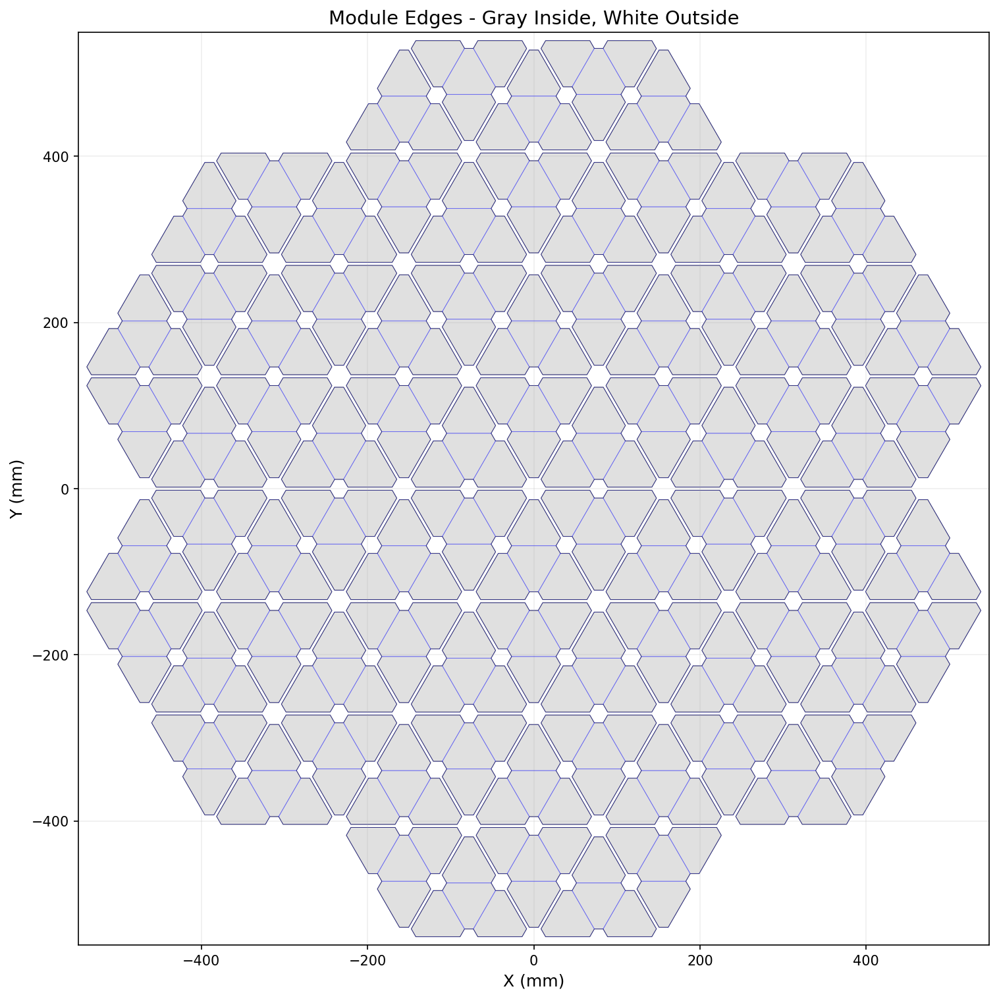

In [7]:


# 使用示例
ply_file = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'

# 绘制填充版本
plot_ply_with_fill(ply_file, 
                   output_file='/home/hmf/work/FA_test/data/focalplane_ply/module_edges_filled.png')

# # 绘制 3D 视图
# plot_ply_3d(ply_file,
#             output_file='/home/hmf/work/FA_test/data/focalplane_ply/module_edges_3d.png')

In [1]:
import numpy as np
from shapely.geometry import Polygon
from shapely.ops import unary_union
from plyfile import PlyData, PlyElement
import scipy.spatial.distance as dist

def read_ply(filename):
    """
    读取 PLY 文件
    
    Returns:
        vertices: (N, 3) 数组，顶点坐标
        faces: list of arrays，每个面的顶点索引
    """
    vertices = []
    faces = []
    
    with open(filename, 'r') as f:
        # 读取 header
        line = f.readline()
        assert line.strip() == 'ply', "不是有效的 PLY 文件"
        
        num_vertices = 0
        num_faces = 0
        header_done = False
        
        while not header_done:
            line = f.readline().strip()
            
            if line.startswith('element vertex'):
                num_vertices = int(line.split()[-1])
            elif line.startswith('element face'):
                num_faces = int(line.split()[-1])
            elif line == 'end_header':
                header_done = True
        
        # 读取顶点
        for _ in range(num_vertices):
            line = f.readline().strip()
            x, y, z = map(float, line.split())
            vertices.append([x, y, z])
        
        # 读取面
        for _ in range(num_faces):
            line = f.readline().strip()
            parts = list(map(int, line.split()))
            num_verts = parts[0]
            indices = parts[1:num_verts+1]
            faces.append(indices)
    
    return np.array(vertices), faces

def calculate_distance(face1, face2, vertices):
    """
    计算两个面之间的最短距离。返回一个标量值，表示面之间的最小距离。
    """
    face1_coords = vertices[face1]
    face2_coords = vertices[face2]
    
    # 计算两组点之间的最短距离
    dist_matrix = dist.cdist(face1_coords, face2_coords)
    min_dist = np.min(dist_matrix)
    return min_dist

def merge_faces(vertices, faces, max_distance=100.0):
    """
    将距离小于 max_distance 的面合并成一个面
    """
    merged_faces = []
    visited = [False] * len(faces)
    
    def merge_two_faces(face1_idx, face2_idx):
        # 合并面
        face1 = faces[face1_idx]
        face2 = faces[face2_idx]
        new_face = list(set(face1) | set(face2))  # 合并两个面
        return new_face

    while not all(visited):
        # 选择一个未访问的面
        i = visited.index(False)
        visited[i] = True
        merged_face = faces[i]

        # 尝试将相邻面合并
        for j in range(i + 1, len(faces)):
            if visited[j]:
                continue
            if calculate_distance(merged_face, faces[j], vertices) < max_distance:
                visited[j] = True
                merged_face = merge_two_faces(i, j)  # 这里传递的是索引

        merged_faces.append(merged_face)
    
    return merged_faces

def save_merged_ply(vertices, faces, output_filename):
    """
    保存合并后的 PLY 文件
    """
    # 写入新的 PLY 文件
    vertex_data = [(v[0], v[1], v[2]) for v in vertices]
    vertices = np.array(vertex_data, dtype=[('x', 'f4'), ('y', 'f4'), ('z', 'f4')])
    
    # 创建 faces 数据
    faces_data = []
    for face in faces:
        # 动态获取每个面的顶点数量
        faces_data.append((len(face), *face))
    
    # 获取每个面顶点索引的最大长度，用于构建 dtype
    max_face_length = max(len(face) for face in faces)
    
    # 使用动态的长度创建 dtype
    faces = np.array(faces_data, dtype=[('vertex_count', 'u4')] + [('vertex_indices', 'u4', (max_face_length,))])

    # 创建 PlyElement
    vertex_element = PlyElement.describe(vertices, 'vertex')
    face_element = PlyElement.describe(faces, 'face')
    
    # 保存 PLY 文件
    ply_data = PlyData([vertex_element, face_element])
    ply_data.write(output_filename)
    print(f"已保存合并后的 PLY 文件: {output_filename}")

def merge_faces_from_ply(input_ply, output_ply, max_distance=100.0):
    """
    从 PLY 文件中读取所有面，合并距离小于 max_distance 的面，并保存为新的 PLY 文件
    """
    vertices, faces = read_ply(input_ply)
    
    # 合并面
    merged_faces = merge_faces(vertices, faces, max_distance)
    
    # 保存合并后的 PLY 文件
    save_merged_ply(vertices, merged_faces, output_ply)

# 使用示例
input_ply = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'
output_ply = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_merged_faces.ply'

merge_faces_from_ply(input_ply, output_ply)

ValueError: could not assign tuple of length 15 to structure with 2 fields.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Polygon
from shapely.ops import unary_union





# 使用示例
ply_file_1 = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'
ply_file_2 = '/home/hmf/work/FA_test/data/focalplane_ply/outer_contour.ply'
output_file = '/home/hmf/work/FA_test/data/focalplane_ply/comparison_plot.png'

plot_ply_edges_on_same_plot(ply_file_1, ply_file_2, output_file)

NameError: name 'plot_ply_edges_on_same_plot' is not defined

/home/hmf/work/FA_test/desi
5 5.64 5.64
Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken


In [4]:
tile_obsha

0.0

In [5]:

radec2xy(hw, tile_ra, tile_dec, tile_obstime, tile_theta, 10.,
             [5.64], [5.64], use_cs5=True)

(array([1.17632524e-15]), array([-5.32328737e-12]))

Total assigned targets: 0.16350267679143426
29197 178572


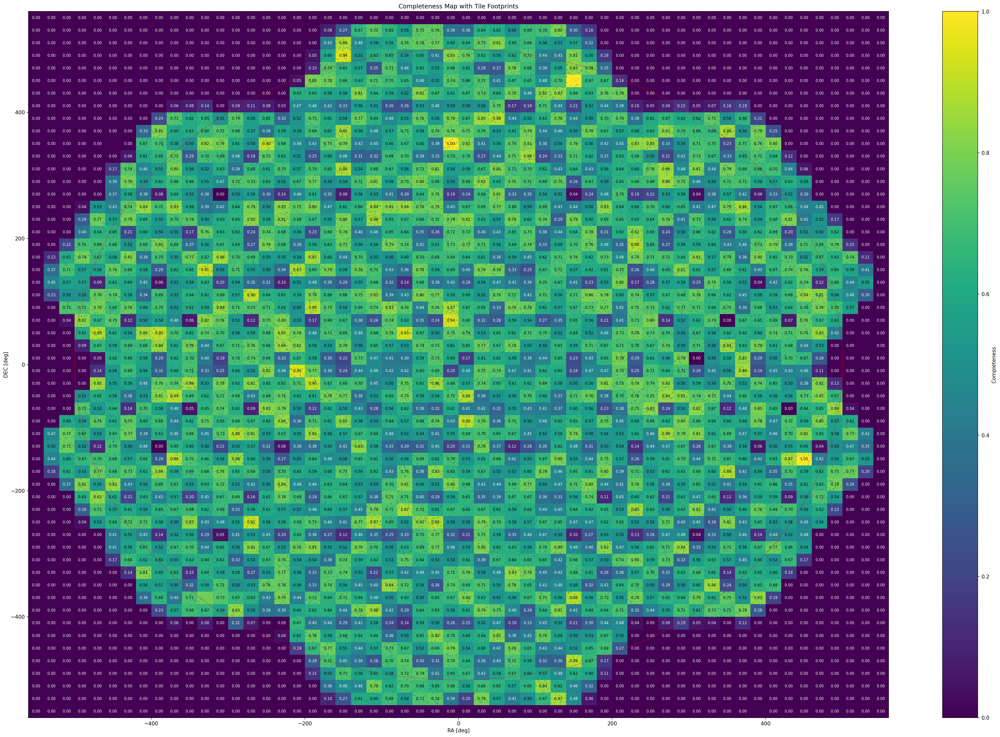

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table, vstack
from matplotlib.patches import Circle
import glob




# =========================
# 1. 读取数据
# =========================
target = Table.read('/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits')

files = glob.glob('/home/hmf/work/FA_test/output/targets_exdense_box5_00_10000_10vist0000*.fits'
)
files = []
for fileID in list(range(5, 90, 9)):
    files.append(f'/home/hmf/work/FA_test/output/targets_exdense_box5_00_10000_10vist0000{fileID:02d}.fits')

# target = Table.read('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits')
# files = glob.glob(f'/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0000000*.fits')


fa_list = []
for f in files:
    tab = Table.read(f)
    tab = tab[tab['FA_TYPE'] > 0]  # 只保留成功分配的目标
    fa_list.append(tab['TARGETID', 'TARGET_RA', 'TARGET_DEC'])

# =========================
# 2. 合并
# =========================
fa_all = vstack(fa_list)

print(f"Total assigned targets: {len(np.unique(fa_all['TARGETID']))/len(fa_all)}")



# =========================
# 4. 去重（关键步骤）
# =========================
# 方法1（推荐）：按 TARGETID 去重，保留第一次出现
_, unique_idx = np.unique(fa_all['TARGETID'], return_index=True)

fa_unique = fa_all[unique_idx]
print(len(fa_unique), len(fa_all))



# 假设字段名如下（根据你的文件改）
ra_t, dec_t = target['RA'], target['DEC']
ra_f, dec_f = fa_unique['TARGET_RA'], fa_unique['TARGET_DEC']

ra_t_xy, dec_t_xy = radec2xy(hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
             ra_t, dec_t, use_cs5=True)
ra_f_xy, dec_f_xy = radec2xy(hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
             ra_f, dec_f, use_cs5=True)


# =========================
# 3. 设置空间网格
# =========================
# 例如：2 deg × 2 deg 的网格
ra_bins  = np.arange(-560, 580, 20)
dec_bins = np.arange(-560, 580, 20)

# =========================
# 4. 统计 target 数量
# =========================
H_target, _, _ = np.histogram2d(ra_t_xy, dec_t_xy, bins=[ra_bins, dec_bins])

# =========================
# 5. 统计已分配数量
# =========================
H_assigned, _, _ = np.histogram2d(ra_f_xy, dec_f_xy, bins=[ra_bins, dec_bins])

# =========================
# 6. 计算 completeness
# =========================
completeness = np.zeros_like(H_target)

mask = H_target > 0
completeness[mask] = H_assigned[mask] / H_target[mask]

# =========================
# 7. 可视化
# =========================
# =========================
# =========================
# 6. 读取 tile
# =========================
tile_radius = 1.28
tiles = Table.read('/home/hmf/work/FA_test/data/random/tiles2.560_10visit.fits')
tiles = tiles[4:5]
tile_x, tile_y  = 0, 0


# =========================
# 7. 画图（更大更清晰）
# =========================
fig, ax = plt.subplots(figsize=(30, 20), dpi=150)

mesh = ax.pcolormesh(ra_bins, dec_bins, completeness.T, shading='auto')
plt.colorbar(mesh, ax=ax, alpha = 0.2, label='Completeness')
plt.scatter(ra_f_xy, dec_f_xy, s=1, alpha=0.5, label='assigned targets')

# =========================
# 8. 标注数值
# =========================
for i in range(len(ra_bins) - 1):
    for j in range(len(dec_bins) - 1):

        if H_target[i, j] < 10:
            continue

        ra_center  = 0.5 * (ra_bins[i] + ra_bins[i+1])
        dec_center = 0.5 * (dec_bins[j] + dec_bins[j+1])

        value = completeness[i, j]
        color = 'white' if value < 0.5 else 'black'

        ax.text(
            ra_center,
            dec_center,
            f"{value:.2f}",
            ha='center',
            va='center',
            fontsize=7,
            color=color
        )

# =========================
# 9. 画 tile footprint（关键）
# =========================
for ra, dec in zip([tile_ra], [tile_dec]):
    circle = Circle(
        (tile_x, tile_y),
        500,
        edgecolor='red',
        facecolor='none',
        linewidth=0.5,
        alpha=0.8
    )
    ax.add_patch(circle)

# =========================
# 10. 美化
# =========================
ax.set_xlabel('RA [deg]')
ax.set_ylabel('DEC [deg]')
ax.set_title('Completeness Map with Tile Footprints')

# ax.set_xlim(ra_bins[0], ra_bins[-1])
# ax.set_ylim(dec_bins[0], dec_bins[-1])
# ax.set_xlim(4, 7.5)
# ax.set_ylim(4, 7.5)

plt.tight_layout()
plt.show()

# completeness inside module range

In [ ]:

# 使用示例
input_ply = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'


In [69]:
print(len(is_inside), len(points), np.sum(is_inside))

248770 248770 43744


In [5]:


# =========================
# 1. 读取数据
# =========================
target = Table.read('/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits')



# 1. 读取所有 FA 文件
import glob

# files = glob.glob('/home/hmf/work/FA_test/output/targets_exdense_box5_00_10000_10vist0000*.fits'
# )
files = []
for fileID in list(range(5, 50, 9)):
    files.append(f'/home/hmf/work/FA_test/output/targets_exdense_box5_00_10000_10vist0000{fileID:02d}.fits')


fa_list = []
for f in files:
    tab = Table.read(f)
    tab = tab[tab['FA_TYPE'] > 0]  # 只保留成功分配的目标
    fa_list.append(tab['TARGETID', 'TARGET_RA', 'TARGET_DEC'])

# =========================
# 2. 合并
# =========================
fa_all = vstack(fa_list)

print(f"Total assigned targets: {len(np.unique(fa_all['TARGETID']))/len(fa_all)}")



# =========================
# 4. 去重（关键步骤）
# =========================
# 方法1（推荐）：按 TARGETID 去重，保留第一次出现
_, unique_idx = np.unique(fa_all['TARGETID'], return_index=True)

fa_unique = fa_all[unique_idx]
print(len(fa_unique), len(fa_all))



# 假设字段名如下（根据你的文件改）
ra_t, dec_t = target['RA'], target['DEC']
ra_f, dec_f = fa_unique['TARGET_RA'], fa_unique['TARGET_DEC']

T_x, T_y = radec2xy(hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
             ra_t, dec_t, use_cs5=True)
A_x, A_y = radec2xy(hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
             ra_f, dec_f, use_cs5=True)


input_ply = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'

completeness = compute_completeness(T_x, T_y, A_x, A_y, input_ply)

print(completeness)

Total assigned targets: 0.31521117601551724
28114 89191
(np.float64(0.6426938551572787), np.int64(43744))


# fba tertiary 

In [39]:
from astropy.table import Table

tiles = Table.read('/home/hmf/work/FA_test/data/random/tiles2.560_10visit.fits')

tiles['RA'] = 5.64
tiles['DEC'] = 5.64
tiles['DESIGNHA'] = 0. 
tiles = tiles[0:1]
print(tiles)
tiles.write('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits', overwrite=True)



 RA  DEC  TILEID IN_DESI PROGRAM OBSCONDITIONS DESIGNHA
---- ---- ------ ------- ------- ------------- --------
5.64 5.64      1       1    DARK             1      0.0


In [8]:
targfn = get_targfn(1, '/home/hmf/work/DESI_II/files/pipweight/')

from astropy.io import fits

hdul = fits.open('/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits')

hdul.info()
print("TARGFN =", targfn)

hdr = read_header_keywords(targfn)



print(hdr)

hdr_faprgrm = hdr["FAPRGRM"]
obscnds = hdr["OBSCONDS"]
sbprof = hdr["SBPROF"]
goaltime = hdr["GOALTIME"]

print("HDRFAPRGRM =", hdr_faprgrm)
print("OBSCONDS =", obscnds)
print("SBPROF =", sbprof)
print("GOALTIME =", goaltime)


Filename: /home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     24   248770R x 8C   [D, D, K, K, J, J, D, K]   
TARGFN = /home/hmf/work/DESI_II/files/pipweight/tertiary-targets-0001.fits
{'FAPRGRM': 'tertiary1', 'OBSCONDS': 'DARK', 'SBPROF': 'ELG', 'GOALTIME': 1200}
HDRFAPRGRM = tertiary1
OBSCONDS = DARK
SBPROF = ELG
GOALTIME = 1200


In [32]:
#!/usr/bin/env python

import sys
from astropy.io import fits


def get_targfn(prognum, targdir):
    """
    从 DESI fiberassign 工具获取 targfn
    """
    from fiberassign.fba_tertiary_io import get_targfn
    return get_targfn(prognum, targdir=targdir)


def copy_header_keys(source_hdr, target_hdr, keys=None, copy_all=False):
    """
    将 header 从 source 复制到 target

    参数：
    - keys: 只复制指定 keyword
    - copy_all: 是否复制全部 header
    """

    if copy_all:
        for key, value in source_hdr.items():
            try:
                target_hdr[key] = value
            except Exception:
                # 有些 FITS keyword 不允许写，跳过
                pass
    else:
        for key in keys:
            if key in source_hdr:
                target_hdr[key] = source_hdr[key]
            else:
                print(f"[WARNING] {key} not found in source header")
# python add_header_to_target.py \
#     /home/hmf/work/DESI_II/files/pipweight/ \
#     /home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits \
#     /home/hmf/work/FA_test/data/random/targets_with_hdr.fits

def main():


# /home/hmf/work/FA_test/data/random/tertiary_test
    targdir = '/home/hmf/work/DESI_II/files/pipweight/'
    target_fn = '/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000_with_TERTIARY_TARGET.fits'
    output_fn = '/home/hmf/work/FA_test/data/random/tertiary_test/tertiary-targets-0001.fits'

    prognum = 1

    print("====================================")
    print("TARGDIR   =", targdir)
    print("TARGET_FN =", target_fn)
    print("OUTPUT_FN =", output_fn)
    print("====================================")

    # =========================
    # 1. 获取 targfn
    # =========================
    targfn = get_targfn(prognum, targdir)
    print("TARGFN =", targfn)

    # =========================
    # 2. 读取 source header
    # =========================
    hdr_source = fits.getheader(targfn, 1)

    print("\n[INFO] Source header keys (部分):")
    for key in ["FAPRGRM", "OBSCONDS", "SBPROF", "GOALTIME"]:
        print(f"{key} =", hdr_source.get(key, "NOT FOUND"))

    # =========================
    # 3. 打开 target fits
    # =========================
    target_table = Table.read(target_fn)
    hdul = fits.open(target_fn)


    print("\n[INFO] HDU structure:")
    hdul.info()

    # 通常 target 在 EXT=1
    target_hdu = hdul[1]
    hdr_target = target_hdu.header

    # =========================
    # 4. 写入 header
    # =========================

    # 方式1：只复制关键字段（推荐）
    keys = ["FAPRGRM", "OBSCONDS", "SBPROF", "GOALTIME"]

    copy_header_keys(
        hdr_source,
        hdr_target,
        keys=keys,
        copy_all=False
    )

    # 如果你想复制全部 header，改成：
    # copy_header_keys(hdr_source, hdr_target, copy_all=True)

    # =========================
    # 5. 保存文件
    # =========================
    hdul.writeto(output_fn, overwrite=True)

    print("\n[INFO] Output written to:", output_fn)

    # =========================
    # 6. 验证
    # =========================
    print("\n[INFO] Verifying header in output:")

    hdr_check = fits.getheader(output_fn, 1)

    for key in keys:
        print(f"{key} =", hdr_check.get(key, "NOT FOUND"))

    print("\n✅ Done!")



from desitarget.targets import encode_targetid
target_table = Table.read('/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits')
target_table['PMRA'] = 0
target_table['PMDEC'] = 0
target_table['REF_EPOCH'] = 2015.5
target_table['TERTIARY_TARGET'] = 'PRINCIPAL'
target_table['CHECKER'] = 'RZ'
target_table['SUBPRIORITY'] = np.random.uniform(0, 1, len(target_table))
# 生成合法 TARGETID
target_table['TARGETID'] = encode_targetid(
    release=8888,
    brickid=1,
    objid=np.arange(len(target_table))
)

target_table.write('/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000_with_TERTIARY_TARGET.fits', overwrite=True)

if __name__ == "__main__":
    main()

TARGDIR   = /home/hmf/work/DESI_II/files/pipweight/
TARGET_FN = /home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000_with_TERTIARY_TARGET.fits
OUTPUT_FN = /home/hmf/work/FA_test/data/random/tertiary_test/tertiary-targets-0001.fits
TARGFN = /home/hmf/work/DESI_II/files/pipweight/tertiary-targets-0001.fits

[INFO] Source header keys (部分):
FAPRGRM = tertiary1
OBSCONDS = DARK
SBPROF = ELG
GOALTIME = 1200

[INFO] HDU structure:
Filename: /home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000_with_TERTIARY_TARGET.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     34   248770R x 13C   [D, D, K, K, J, J, D, K, K, K, D, 9A, 2A]   

[INFO] Output written to: /home/hmf/work/FA_test/data/random/tertiary_test/tertiary-targets-0001.fits

[INFO] Verifying header in output:
FAPRGRM = tertiary1
OBSCONDS = DARK
SBPROF = ELG
GOALTIME = 1200

✅ Done!


In [33]:
print(target_table['SUBPRIORITY'])

    SUBPRIORITY    
-------------------
 0.1915194503788923
 0.6221087710398319
 0.4377277390071145
 0.7853585837137692
 0.7799758081188035
 0.2725926052826416
 0.2764642551430967
 0.8018721775350193
 0.9581393536837052
 0.8759326347420947
                ...
  0.515641345854148
 0.7367328740546464
 0.1903597682137027
 0.2182550932548346
 0.8289033179661077
 0.7164016156518682
 0.9721987633159574
0.20789425343757073
 0.3161985581924567
0.08418544001658446
Length = 248770 rows


In [35]:
#!/usr/bin/env python

import os
import subprocess
import tempfile
import numpy as np
from astropy.table import Table


def run_cmd(cmd):
    print(cmd)
    subprocess.run(cmd, shell=True, check=True)


def get_targfn(prognum, targdir):
    from fiberassign.fba_tertiary_io import get_targfn
    return get_targfn(prognum, targdir=targdir)


def get_toofn(prognum, tileid, targdir):
    from fiberassign.fba_tertiary_io import get_toofn
    return get_toofn(prognum, tileid, targdir=targdir)


def read_header_keywords(targfn):
    """读取 FITS header 关键字"""
    from astropy.io import fits

    hdr = fits.getheader(targfn, 1)

    return {
        "FAPRGRM": hdr.get("FAPRGRM"),
        "OBSCONDS": hdr.get("OBSCONDS"),
        "SBPROF": hdr.get("SBPROF"),
        "GOALTIME": hdr.get("GOALTIME"),
    }


def main(targdir, ntile):

    # =========================
    # 基本参数
    # =========================
    prognum = 1
    prognum_pad = f"{prognum:02d}"

    tilefn = f'{targdir}//tertiary-tiles-0001.fits'
    fadir = targdir

    survey = "main"
    dtver = "1.1.1"
    hdr_survey = "special"

    print(f"PROGNUM = {prognum}")
    print(f"TARGDIR = {targdir}")
    print(f"TILEFN = {tilefn}")
    print(f"FADIR = {fadir}")

    # =========================
    # 环境变量（可选）
    # =========================
    os.environ["DESIMODEL"] = "/global/homes/m/mfhe/work/FA_test/desi/"

    # =========================
    # target 文件
    # =========================
    targfn = get_targfn(prognum, targdir)# f'/home/hmf/work/FA_test/data/random/tertiary_test/targets_exdense_box5_{prognum_pad}_10000_with_hdr.fits'
    print("TARGFN =", targfn)

    hdr = read_header_keywords(targfn)

    hdr_faprgrm = hdr["FAPRGRM"]
    obscnds = hdr["OBSCONDS"]
    sbprof = hdr["SBPROF"]
    goaltime = hdr["GOALTIME"]

    print("HDRFAPRGRM =", hdr_faprgrm)
    print("OBSCONDS =", obscnds)
    print("SBPROF =", sbprof)
    print("GOALTIME =", goaltime)

    # =========================
    # 读取 tile 文件
    # =========================
    tiles = Table.read(tilefn, format="fits")

    # 只取前 ntile 个
    tiles = tiles[:ntile]

    previous_tileids = []

    # =========================
    # 主循环
    # =========================
    for i, tile in enumerate(tiles, start=1):

        tileid = int(tile["TILEID"])
        tilera = float(tile["RA"])
        tiledec = float(tile["DEC"])
        tileha = float(tile["DESIGNHA"])

        outfile = os.path.join(
            fadir, "output", f"fiberassign-{tileid:06d}.fits.gz"
        )

        print("\n======================")
        print(f"Processing TILE {tileid}")
        print("OUTFILE =", outfile)

        # 跳过已有
        if os.path.exists(outfile):
            print(f"Tile {tileid} already done, skipping...")
            previous_tileids.append(tileid)
            continue

        # =========================
        # ToO 文件
        # =========================
        toofn = f'/home/hmf/work/FA_test/data/random/tertiary_test/output/{os.path.basename(targfn).replace(".fits", "")}_{tileid:06d}.ecsv'
        logfn = toofn.replace(".ecsv", ".log")

        # -------------------------
        # fba_tertiary_too
        # -------------------------
        cmd = (
            f"fba_tertiary_too "
            f"--tileid {tileid+8000} "
            f"--tilera {tilera} "
            f"--tiledec {tiledec} "
            f"--targdir {targdir} "
            f"--fadir {fadir} "
            f"--prognum {prognum} "
        )

        if len(previous_tileids) > 0:
            prev_str = ",".join(map(str, previous_tileids))
            cmd += f"--previous_tileids {prev_str} "

        cmd += f"> {logfn} 2>&1"

        run_cmd(cmd)

        # # -------------------------
        # # shuffle ToO
        # # -------------------------
        # shuffle_script = "/global/homes/m/mfhe/github/desi2-forecast/notebook/shuffle_too_for_128realizations.py"

        # run_cmd(f"python {shuffle_script} {toofn} {toofn}")

        # -------------------------
        # fba_launch
        # -------------------------
        cmd = (
            f"fba_launch "
            f"--outdir {fadir} "
            f"--tileid {tileid} "
            f"--tilera {tilera} "
            f"--tiledec {tiledec} "
            f"--ha {tileha} "
            f"--survey {survey} "
            f"--program {obscnds} "
            f"--sbprof {sbprof} "
            f"--goaltime {goaltime} "
            f"--dtver {dtver} "
            f"--hdr_survey {hdr_survey} "
            f"--hdr_faprgrm {hdr_faprgrm} "
            f"--rundate 2025-10-27T17:01:02+00:00 "
            f"--nosteps scnd "
            f"--targ_std_only "
            f"--too_tile "
            f"--forcetileid y "
            f"--custom_too_file {toofn} "
            f"--custom_too_development"
        )

        run_cmd(cmd)

        previous_tileids.append(tileid)


if __name__ == "__main__":
    import sys

    # if len(sys.argv) < 3:
    #     print("Usage: python script.py TARGDIR NTILE")
    #     sys.exit(1)

    targdir = '/home/hmf/work/FA_test/data/random/tertiary_test/' # f"/home/hmf/work/FA_test/data/random/targets_exdense_box5_{prognum_pad}_10000.fits"
    ntile = 1

    main(targdir, ntile)

PROGNUM = 1
TARGDIR = /home/hmf/work/FA_test/data/random/tertiary_test/
TILEFN = /home/hmf/work/FA_test/data/random/tertiary_test///tertiary-tiles-0001.fits
FADIR = /home/hmf/work/FA_test/data/random/tertiary_test/
TARGFN = /home/hmf/work/FA_test/data/random/tertiary_test/tertiary-targets-0001.fits
HDRFAPRGRM = tertiary1
OBSCONDS = DARK
SBPROF = ELG
GOALTIME = 1200

Processing TILE 1
OUTFILE = /home/hmf/work/FA_test/data/random/tertiary_test/output/fiberassign-000001.fits.gz
fba_tertiary_too --tileid 8001 --tilera 5.64 --tiledec 5.64 --targdir /home/hmf/work/FA_test/data/random/tertiary_test/ --fadir /home/hmf/work/FA_test/data/random/tertiary_test/ --prognum 1 > /home/hmf/work/FA_test/data/random/tertiary_test/output/tertiary-targets-0001_000001.log 2>&1
fba_launch --outdir /home/hmf/work/FA_test/data/random/tertiary_test/ --tileid 1 --tilera 5.64 --tiledec 5.64 --ha 0.0 --survey main --program DARK --sbprof ELG --goaltime 1200 --dtver 1.1.1 --hdr_survey special --hdr_faprgrm tertiary

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_launch:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')
usage: fba_launch [-h] --outdir OUTDIR --tileid TILEID [--forcetileid {y,n}]
                  --tilera TILERA --tiledec TILEDEC [--ha HA] --survey
                  {sv1,sv2,sv3,main} --program {DARK,BRIGHT,BACKUP}
                  [--goaltype {DARK,BRIGHT,BACKUP}] [--goaltime GOALTIME]
                  [--sbprof {ELG,BGS,PSF,FLT}] [--mintfrac MINTFRAC]
                  [--rundate RUNDATE] [--mtltime MTLTIME]
                  [--standards_per_module STANDARDS_PER_MODULE]
                  [--sky_per_module SKY_PER_MODULE]
                  [--sky_per_slitblock SKY_PER_SLITBLOCK]
                  [--margin-pos MARGIN_POS] [--margin-module MARGIN_MODULE]
                  [--margin-gfa MARGIN_GFA] [--dr {dr9}] [--gaiadr {gaiadr2}]
                

CalledProcessError: Command 'fba_launch --outdir /home/hmf/work/FA_test/data/random/tertiary_test/ --tileid 1 --tilera 5.64 --tiledec 5.64 --ha 0.0 --survey main --program DARK --sbprof ELG --goaltime 1200 --dtver 1.1.1 --hdr_survey special --hdr_faprgrm tertiary1 --rundate 2025-10-27T17:01:02+00:00 --nosteps scnd --targ_std_only --too_tile --forcetileid y --custom_too_file /home/hmf/work/FA_test/data/random/tertiary_test/output/tertiary-targets-0001_000001.ecsv --custom_too_development' returned non-zero exit status 2.

# fba_run re 

In [ ]:

import os
os.environ["DESIMODEL"] = os.path.expanduser("~/work/FA_test/desi")
print(os.environ["DESIMODEL"])
import subprocess
import numpy as np
from astropy.table import Table





# =========================
# 主循环
# =========================

# =========================
# 配置（按你的实际路径）
# =========================
target_init = "/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits"
output_dir = "/home/hmf/work/FA_test/data/random/Nrepet_test/output/"
footprint = "/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits"

n_iter = 5  # 重复次数

os.makedirs(output_dir, exist_ok=True)

current_target = target_init

for i in range(n_iter):
    print(f"\n========== Iteration {i} ==========")

    prefix = f"iter{i:02d}"

    # 1. 跑 fba
    run_fba(current_target, prefix)

    # 2. 找输出文件
    fba_file = find_fba_file(prefix)
    print(f"  Using fba file: {fba_file}")

    # 3. 读取分配结果
    assigned_ids = get_assigned_ids(fba_file)

    # 4. 生成新 target 文件
    new_target = f"/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a{i+1}.fits"
    update_target(current_target, assigned_ids, new_target)

    # 5. 更新
    current_target = new_target

/home/hmf/work/FA_test/desi

========== Iteration 0 ==========

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits --rundate 2025-10-27T17:01:02+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/data/random/Nrepet_test/output/ --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits has 248770 rows.  Reading in chunks of 1000000
INFO: rundate = 2025-10-27T17:01:02+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 55597 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.14 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.06 seconds (1 calls)
INFO: lookup_sky_source == 'ls', will look for $SKYBRICKS_DIR
INFO: Assig


========== Iteration 1 ==========

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a1.fits --rundate 2025-10-27T17:01:02+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/data/random/Nrepet_test/output/ --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter01


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a1.fits has 230945 rows.  Reading in chunks of 1000000
INFO: rundate = 2025-10-27T17:01:02+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a1.fits:  0.26 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 37772 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.23 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.03 seconds (1 calls)
INFO: lookup_sky_source == 'ls', will look for $SKYBRICKS_DIR
INFO:

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a2.fits has 218743 rows.  Reading in chunks of 1000000
INFO: rundate = 2025-10-27T17:01:02+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a2.fits:  0.25 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 25570 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.09 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.02 seconds (1 calls)
INFO: lookup_sky_source == 'ls', will look for $SKYBRICKS_DIR
INFO:

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a3.fits has 212417 rows.  Reading in chunks of 1000000
INFO: rundate = 2025-10-27T17:01:02+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a3.fits:  0.24 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 19244 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.12 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.01 seconds (1 calls)
INFO: lookup_sky_source == 'ls', will look for $SKYBRICKS_DIR
INFO:

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a4.fits has 209899 rows.  Reading in chunks of 1000000
INFO: rundate = 2025-10-27T17:01:02+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001_a4.fits:  0.24 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 16726 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.00 seconds (1 calls)
INFO: lookup_sky_source == 'ls', will look for $SKYBRICKS_DIR
INFO:

Total assigned targets: 1.0
{'n_rows': 39944, 'n_unique': 39944, 'unique_fraction': 1.0}


(<Figure size 4500x3000 with 2 Axes>,
 <Axes: title={'center': 'Completeness Map with Tile Footprints'}, xlabel='RA [deg]', ylabel='DEC [deg]'>)

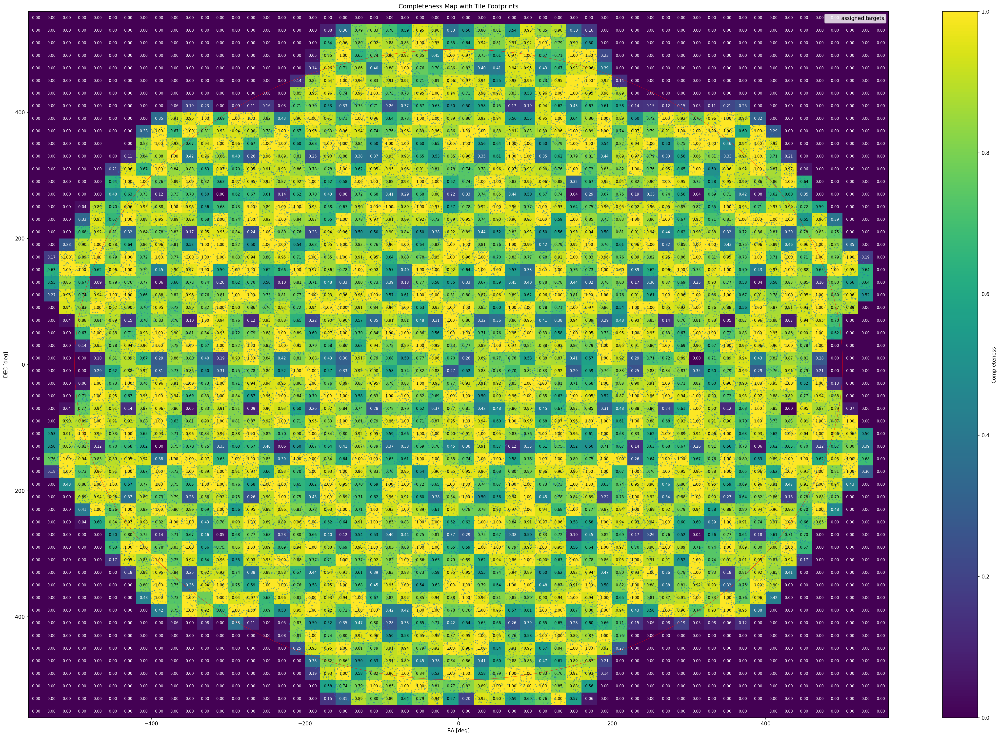

In [4]:
target = Table.read('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits')
files = glob.glob('/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0*.fits')

fa_all, fa_unique, stats = collect_unique_assignments(files, keep_assigned_only=True)
print(f"Total assigned targets: {stats['unique_fraction']}")
print(stats)

ra_t_xy, dec_t_xy = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    target['RA'], target['DEC'], use_cs5=True,
)
ra_f_xy, dec_f_xy = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    fa_unique['TARGET_RA'], fa_unique['TARGET_DEC'], use_cs5=True,
)

ra_bins = np.arange(-560, 580, 20)
dec_bins = np.arange(-560, 580, 20)
grid = compute_completeness_grid((ra_t_xy, dec_t_xy), (ra_f_xy, dec_f_xy), ra_bins, dec_bins)

plot_completeness_map(
    grid,
    tile_centers=[(0, 0)],
    tile_radius=500,
    figsize=(30, 20),
    scatter_points=(ra_f_xy, dec_f_xy),
    circle_kwargs={'alpha': 0.8},
)


## fba res with module edges

In [19]:
def plot_fa_on_focalplane_auto(
    target_file,
    fa_pattern,
    ply_file,
    hw=None,   # ⭐ 新增
    only_inside = True,
    keep_assigned_only=True,
    figsize=(20, 20),
    s_target=1,
    s_assigned=1,
    output=None
):
    """
    自动从 FA 文件读取 tile 信息；支持传入 hw（避免重复加载）
    """

    import glob
    import matplotlib.pyplot as plt
    from astropy.table import Table

    # =========================
    # 1. 找 FA 文件
    # =========================
    files = sorted(glob.glob(fa_pattern))
    if len(files) == 0:
        raise ValueError("No FA files found!")

    infile = files[0]

    # =========================
    # 2. 读取 tile 信息
    # =========================
    header, fiber_data, targets_data, avail_data, gfa_data = \
        read_assignment_fits_tile(infile)

    tile_ra = float(header["TILERA"])
    tile_dec = float(header["TILEDEC"])
    tile_theta = float(header["FIELDROT"])
    tile_obstime = header["FA_PLAN"]
    tile_obsha = float(header["FA_HA"])
    run_date = header["FA_RUN"]

    # =========================
    # 3. hardware（可选加载）
    # =========================
    if hw is None:
        margins = {}
        for key in ['pos', 'gfa', 'module']:
            hdrkey = "FA_M_%s" % key[:3]
            if hdrkey in header:
                margins[key] = header[hdrkey]

        print("Loading hardware (slow)...")
        hw = load_hardware(rundate=run_date, add_margins=margins)
    else:
        print("Using provided hardware")

    # =========================
    # 4. 读取数据
    # =========================
    target = Table.read(target_file)

    _, fa_unique, stats = collect_unique_assignments(
        files, keep_assigned_only=keep_assigned_only
    )

    print(f"Total assigned targets: {stats['unique_fraction']}")
    print(stats)

    

    # =========================
    # 5. 坐标投影
    # =========================
    ra_t_xy, dec_t_xy = radec2xy(
        hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
        target['RA'], target['DEC'], use_cs5=True,
    )

    ra_f_xy, dec_f_xy = radec2xy(
        hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
        fa_unique['TARGET_RA'], fa_unique['TARGET_DEC'], use_cs5=True,
    )
    # =========================
    # 筛选 inside（用你的函数）
    # =========================
    if only_inside:
        print("Filtering targets inside focal plane (multipolygon)...")

        multipolygon = read_ply_as_multipolygon(ply_file)

        points_t = np.column_stack((ra_t_xy, dec_t_xy))
        mask_t = check_points_in_multipolygon(points_t, multipolygon)

        print(f"Targets inside: {mask_t.sum()} / {len(mask_t)}")

        ra_t_xy = ra_t_xy[mask_t]
        dec_t_xy = dec_t_xy[mask_t]
    print(f"Final target count: {len(ra_t_xy)} {len(ra_f_xy)}")
    # =========================
    # 6. 画图
    # =========================
    fig, ax = plt.subplots(figsize=figsize)

    # 

    ax.scatter(ra_t_xy, dec_t_xy,
               s=s_target, alpha=0.2,
               label='Targets', zorder=2)

    ax.scatter(ra_f_xy, dec_f_xy,
               s=s_assigned, alpha=0.9,
               label='Assigned', zorder=3)
    plot_ply_with_fill(ply_file, ax=ax)

    ax.legend()
    ax.set_title("FA + Focal Plane")
    ax.set_aspect('equal')

    if output is not None:
        plt.savefig(output, dpi=200, bbox_inches='tight')

    plt.show()

    return fig, ax, stats, hw


===== Test 1: auto hw =====
Using provided hardware


Total assigned targets: 1.0
{'n_rows': 39944, 'n_unique': 39944, 'unique_fraction': 1.0}
Filtering targets inside focal plane (multipolygon)...
Targets inside: 43744 / 248770
Final target count: 43744 39944
顶点数: 2352
面数: 336


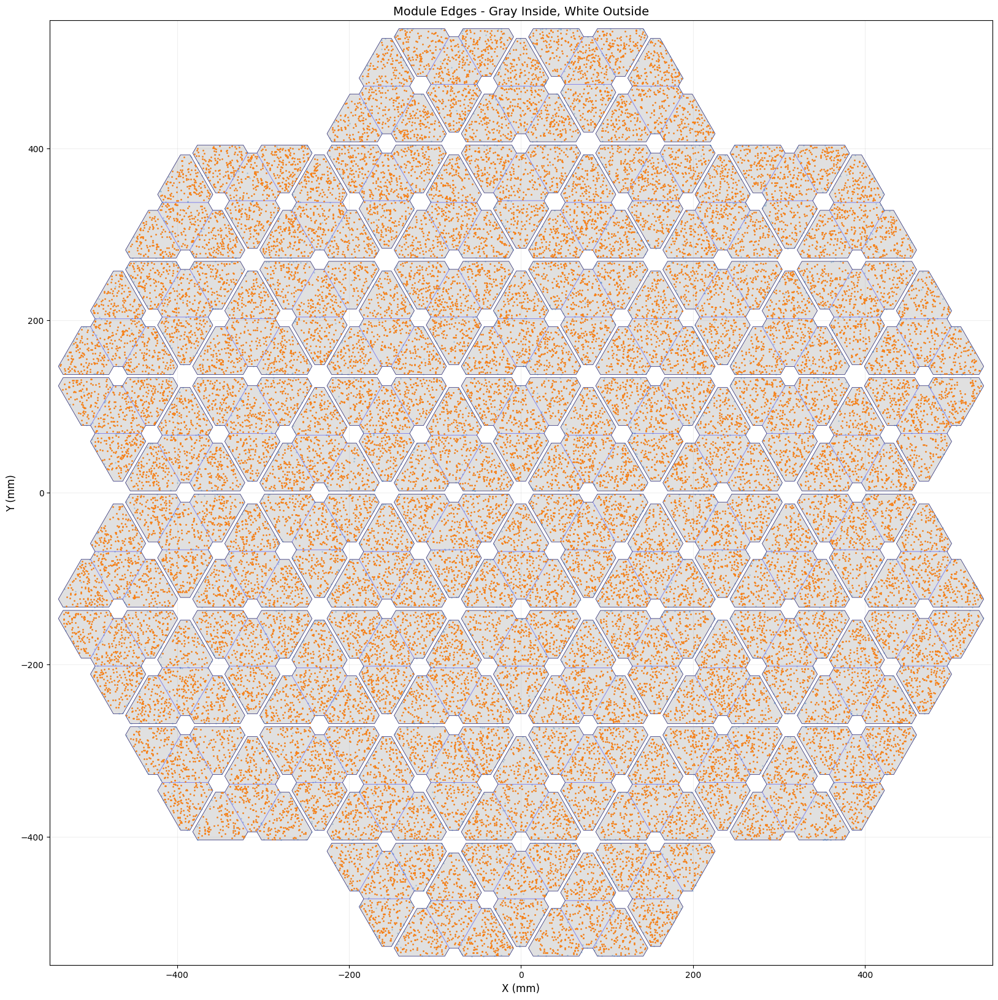

Time (auto hw): 6.07 s


In [20]:
import time
from astropy.table import Table

# =========================
# 1. 配置路径
# =========================
target_file = '/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits'
fa_pattern  = '/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0*.fits'
ply_file    = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'

# =========================
# 2. 单次运行（自动加载 hw）
# =========================
print("\n===== Test 1: auto hw =====")
t0 = time.time()

fig, ax, stats, hw = plot_fa_on_focalplane_auto(
    target_file=target_file,
    fa_pattern=fa_pattern,
    ply_file=ply_file,
    hw=hw   # 自动加载
)

t1 = time.time()
print(f"Time (auto hw): {t1 - t0:.2f} s")




Total assigned targets: 1.0
{'n_rows': 39944, 'n_unique': 39944, 'unique_fraction': 1.0}


顶点数: 2352
面数: 336


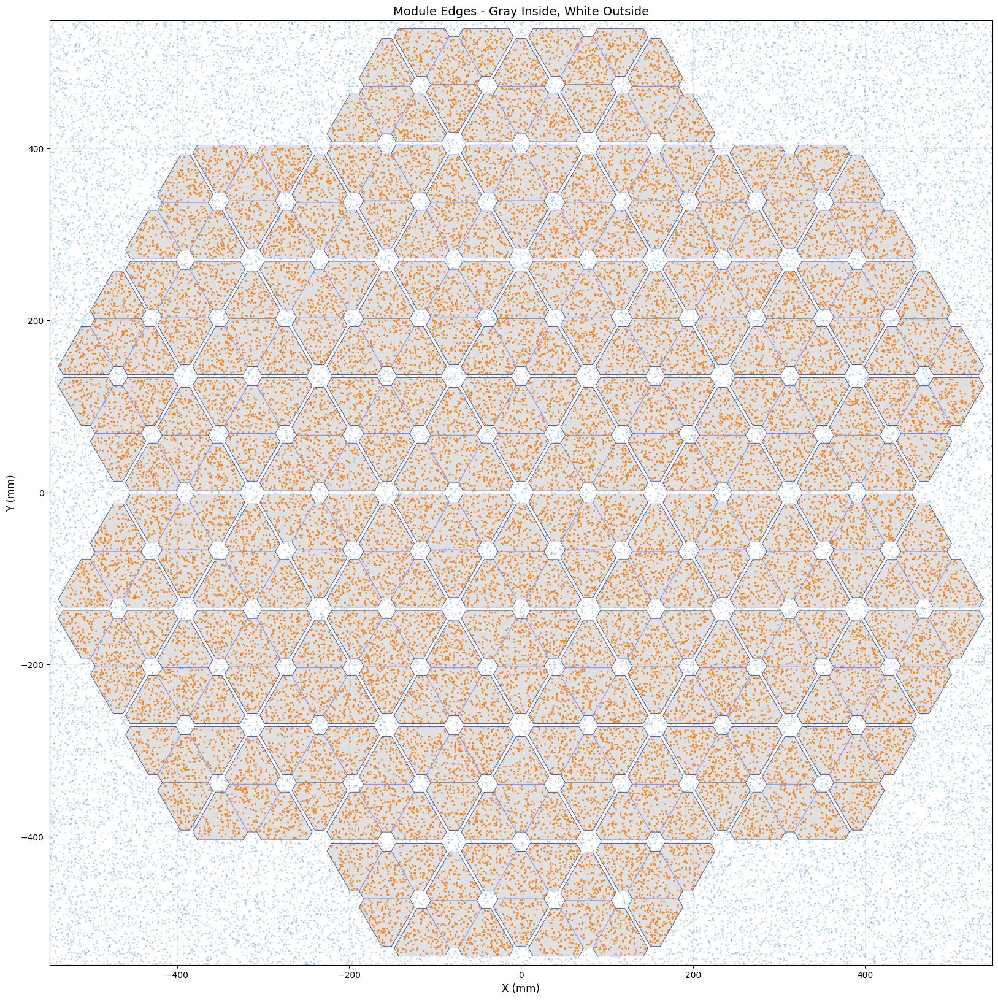

In [9]:
fig, ax = plt.subplots(figsize=(20, 20))



target = Table.read('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits')
files = glob.glob('/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0*.fits')

fa_all, fa_unique, stats = collect_unique_assignments(files, keep_assigned_only=True)
print(f"Total assigned targets: {stats['unique_fraction']}")
print(stats)
# 2️⃣ 投影
ra_t_xy, dec_t_xy = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    target['RA'], target['DEC'], use_cs5=True,
)

ra_f_xy, dec_f_xy = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    fa_unique['TARGET_RA'], fa_unique['TARGET_DEC'], use_cs5=True,
)

# 3️⃣ scatter
ax.scatter(ra_t_xy, dec_t_xy,
           s=1, alpha=0.2, label='Targets', zorder=2)

ax.scatter(ra_f_xy, dec_f_xy,
           s=1, alpha=0.9, label='Assigned', zorder=3)

# 1️⃣ 画 focal plane
plot_ply_with_fill(
    '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply',
    ax=ax
)
# 4️⃣ 美化
ax.legend()
ax.set_title("FA + Focal Plane")

plt.show()

### test completeness

Total assigned targets: 1.0
{'n_rows': 17865, 'n_unique': 17865, 'unique_fraction': 1.0}
completeness ply: 0.40839886613021215 num: 43744
completeness all: 0.2490346683022708 71737.0
Total assigned targets: 1.0
{'n_rows': 30004, 'n_unique': 30004, 'unique_fraction': 1.0}


completeness ply: 0.6858997805413314 num: 43744
completeness all: 0.418249996515048 71737.0
Total assigned targets: 1.0
{'n_rows': 36345, 'n_unique': 36345, 'unique_fraction': 1.0}


completeness ply: 0.8308568032187271 num: 43744
completeness all: 0.5066423184688515 71737.0
Total assigned targets: 1.0
{'n_rows': 38881, 'n_unique': 38881, 'unique_fraction': 1.0}


completeness ply: 0.8888304681784931 num: 43744
completeness all: 0.5419936713272091 71737.0
Total assigned targets: 1.0
{'n_rows': 39675, 'n_unique': 39675, 'unique_fraction': 1.0}


completeness ply: 0.9069815288953914 num: 43744
completeness all: 0.5530618788073101 71737.0
Total assigned targets: 1.0
{'n_rows': 39881, 'n_unique': 39881, 'unique_fraction': 1.0}


completeness ply: 0.9116907461594733 num: 43744
completeness all: 0.5559334792366561 71737.0
Total assigned targets: 1.0
{'n_rows': 39929, 'n_unique': 39929, 'unique_fraction': 1.0}


completeness ply: 0.9127880395025604 num: 43744
completeness all: 0.5566025900163096 71737.0
Total assigned targets: 1.0
{'n_rows': 39942, 'n_unique': 39942, 'unique_fraction': 1.0}


completeness ply: 0.9130852231163131 num: 43744
completeness all: 0.5567838075191324 71737.0
Total assigned targets: 1.0
{'n_rows': 39944, 'n_unique': 39944, 'unique_fraction': 1.0}


completeness ply: 0.9131309436722751 num: 43744
completeness all: 0.5568116871349513 71737.0
Total assigned targets: 1.0
{'n_rows': 39944, 'n_unique': 39944, 'unique_fraction': 1.0}


completeness ply: 0.9131309436722751 num: 43744
completeness all: 0.5568116871349513 71737.0


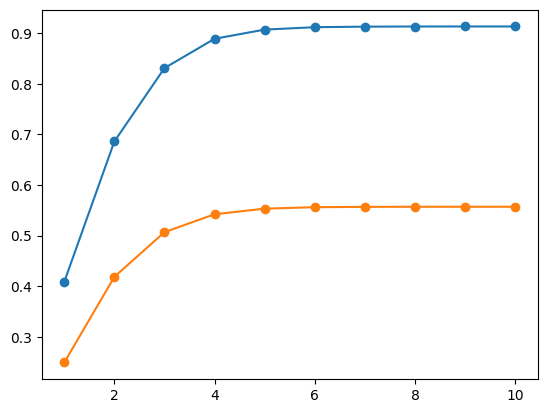

In [2]:
import sys
sys.path.append('/home/hmf/work/FA_test/nb/')
from test_MUST_fp import *
# 假设字段名如下（根据你的文件改）
# =========================
# 1. 读取数据
# =========================

import glob
target = Table.read('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits')
files = glob.glob('/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0*.fits')

ra_t, dec_t = target['RA'], target['DEC']
T_x, T_y = radec2xy(hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
             ra_t, dec_t, use_cs5=True)


com_list = []   
for i in range(10):
    com_list.append(completeness_ply(T_x, T_y, fa_files = files[0:i+1], hw = hw))

import matplotlib.pyplot as plt
plt.Figure()
plt.plot(range(1, 11), [com_list[i][0] for i in range(10)], marker='o')
plt.plot(range(1, 11), [com_list[i][1] for i in range(10)], marker='o')

# mock catalogue

In [ ]:
import numpy as np

import glob

# =========================
# 1. Galaxy 配置（核心）
# =========================
GALAXY_CONFIG = {
    'BGS': {
        'PRIORITY_INIT': 1,
        'PRIORITY': 1,
        'type_id': 0,
        'time': 0.04,
        'NUMOBS_INIT': int(np.ceil(0.04 * 3.0)),
        'OBSCONDITIONS': 2,
        'DESI_TARGET': np.int64(2**0),
        'BGS_TARGET': np.int64(2**0),
    },
    'LRG': {
        'PRIORITY_INIT': 3,
        'PRIORITY': 3,
        'type_id': 1,
        'time': 1.15,
        'NUMOBS_INIT': int(np.ceil(1.15 * 3.0)),
        'OBSCONDITIONS': 2,
        'DESI_TARGET': np.int64(2**0)
    },
    'ELG': {
        'PRIORITY_INIT': 5,
        'PRIORITY': 5,
        'type_id': 2,
        'time': 0.32,
        'NUMOBS_INIT': int(np.ceil(0.32 * 3.0)),
        'OBSCONDITIONS': 2,
        'DESI_TARGET': np.int64(2**1)
    },
    # 'LBG': {
    #     'PRIORITY_INIT': 9,
    #     'type_id': 3,
    #     'time': lambda tab: np.where(tab['Z'] > 3.5, 5.8, 2.5),
    #     'NUMOBS_INIT': lambda tab: np.int32(np.ceil(tab['TIME'] * 3.0)),
    #     'OBSCONDITIONS': 1,
    #     'DESI_TARGET': np.int64(2**2)
    # }  
    # 以后可以直接扩展
}


# =========================
# 4. 主流程
# =========================
def main():

    # ===== 参数 =====
    N = None
    RANDOM = False
    base_dir = "/home/hmf/work/FA_test/MUST_mock/"
    # ===== 读取（改为 npy）=====
    ramin, ramax = 0, 10#, 20
    decmin, decmax = 0, 10#, 20
    cats=[]
    gts = []
    for gt in GALAXY_CONFIG.keys():
        file = f"{base_dir}/MUST_{gt}_*.npy"
        file = glob.glob(file)[0]
        print(f"Found file: {file}")
        cat = load_npy_as_table(file, N=N, random=RANDOM)
        print(gt, len(cat))
        # gt = file.split('/')[-1].split('_')[1]
        cat = cat[(cat['RA']>ramin) & (cat['RA']<ramax) & (cat['DEC']>decmin) & (cat['DEC']<decmax)]
        
        gts.append(gt)

        # ===== 添加信息 =====
        cat_o = add_galaxy_info(cat, gt, GALAXY_CONFIG)
        cats.append(cat_o)

    # ===== 合并 =====
    merged = vstack(cats, join_type='outer')
    npoints = len(merged)
    merged.add_column(np.arange(npoints).astype('int64') + 1, name='TARGETID')
    merged.add_column(np.random.uniform(low=0,high=1,size=npoints).astype('float64'), name='SUBPRIORITY')# add_column(np.array([0.]*npoints).astype('float64'), name='SUBPRIORITY')
    # # ===== 输出 =====
    output_file = f'{base_dir}/MUST_merged_{"_".join(gts)}_box{ramin}-{ramax}_{decmin}-{decmax}.fits'
    merged.write(output_file, overwrite=True)

    

    print(f"Saved to {output_file}", len(merged), len(merged)/100)
    print(merged.keys())
    return merged



# =========================
# 5. 执行
# =========================
if __name__ == "__main__":
    main()


Found file: /home/hmf/work/FA_test/MUST_mock/MUST_BGS_z0.05z0.75.npy
BGS 30621712
Found file: /home/hmf/work/FA_test/MUST_mock/MUST_LRG_z0.6z1.3.npy
LRG 12176686
Found file: /home/hmf/work/FA_test/MUST_mock/MUST_ELG_z0.8z1.5.npy
ELG 51662300
Saved to /home/hmf/work/FA_test/MUST_mock//MUST_merged_BGS_LRG_ELG_box0-10_0-10.fits 625561 6255.61
['RA', 'DEC', 'Z', 'Z_cosmo', 'GAL_TYPE', 'PRIORITY_INIT', 'PRIORITY', 'TYPE_ID', 'TIME', 'NUMOBS_INIT', 'OBSCONDITIONS', 'DESI_TARGET', 'BGS_TARGET', 'TARGETID', 'SUBPRIORITY']


In [15]:
(30621712+12176686+51662300)/9000

10495.63311111111

In [2]:
from astropy.table import Table

tiles = Table.read('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits')

tiles['PROGRAM'] = 'GRAY'
tiles['OBSCONDITIONS'] = 2
print(tiles)
tiles.write('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001_gray.fits', overwrite=True)


 RA  DEC  TILEID IN_DESI PROGRAM OBSCONDITIONS DESIGNHA
---- ---- ------ ------- ------- ------------- --------
5.64 5.64      1       1    GRAY             2      0.0


In [11]:

# =========================
# 配置（按你的实际路径）
# =========================
target_init = "/home/hmf/work/FA_test/MUST_mock//MUST_merged_BGS_LRG_ELG_box0-10.fits"
output_dir = "/home/hmf/work/FA_test/data/random/Nrepet_test/mock_output/"
footprint = "/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001_gray.fits"
name_base = os.path.basename(target_init).split('.')[0]

n_iter = 10  # 重复次数

os.makedirs(output_dir, exist_ok=True)

current_target = target_init


for i in range(n_iter):
    print(f"\n========== Iteration {i} ==========")

    prefix = f"iter{i:02d}"

    # 1. 跑 fba
    run_fba(current_target, prefix)

    # 2. 找输出文件
    fba_file = find_fba_file(prefix)
    print(f"  Using fba file: {fba_file}")

    # 3. 读取分配结果
    assigned_ids = get_assigned_ids(fba_file)

    # 4. 生成新 target 文件
    new_target = f"/home/hmf/work/FA_test/data/random/Nrepet_test/{name_base}_a{i+1}.fits"
    update_target(current_target, assigned_ids, new_target)

    # 5. 更新
    current_target = new_target



========== Iteration 0 ==========


NameError: name 'run_fba' is not defined

In [ ]:
target = Table.read('/home/hmf/work/FA_test/MUST_mock//MUST_merged_BGS_LRG_ELG_box0-10.fits')
files = glob.glob('/home/hmf/work/FA_test/data/random/Nrepet_test/mock_output/iter0*.fits')

fa_all, fa_unique, stats = collect_unique_assignments(files, keep_assigned_only=True)
print(f"Total assigned targets: {stats['unique_fraction']}")
print(stats)

ra_t_xy, dec_t_xy = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    target['RA'], target['DEC'], use_cs5=True,
)
ra_f_xy, dec_f_xy = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    fa_unique['TARGET_RA'], fa_unique['TARGET_DEC'], use_cs5=True,
)

ra_bins = np.arange(-560, 580, 20)
dec_bins = np.arange(-560, 580, 20)
grid = compute_completeness_grid((ra_t_xy, dec_t_xy), (ra_f_xy, dec_f_xy), ra_bins, dec_bins)

plot_completeness_map(
    grid,
    tile_centers=[(0, 0)],
    tile_radius=500,
    figsize=(30, 20),
    scatter_points=(ra_f_xy, dec_f_xy),
    circle_kwargs={'alpha': 0.8},
)


In [ ]:
target = Table.read('/home/hmf/work/FA_test/MUST_mock//MUST_merged_BGS_LRG_ELG_box0-10.fits')
files = sorted(glob.glob('/home/hmf/work/FA_test/data/random/Nrepet_test/mock_output/iter*.fits'))

ra_t, dec_t = target['RA'], target['DEC']
T_x, T_y = radec2xy(
    hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
    ra_t, dec_t, use_cs5=True,
)

com_list = [
    completeness_ply(T_x, T_y, files[: i + 1], hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha)
    for i in range(min(10, len(files)))
]

plot_completeness_curve(
    range(1, len(com_list) + 1),
    com_list,
    labels=('inside footprint', 'overall'),
)
